In [1]:
# Pytorch is already installed on colab, so no pip install :)
import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np

# Set GPU device
print(torch.cuda.is_available())
device = torch.device("cuda:0")

True


In [2]:
import torch.nn as nn
import torch.nn.functional as F

class CNN(nn.Module):
    def __init__(self):
        # Initialize super class
        super(CNN, self).__init__()

        # Define architecture of CNN
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=5, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=5, out_channels=10, kernel_size=3, padding=1)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv3 = nn.Conv2d(in_channels=10, out_channels=20, kernel_size=5, padding=2)
        self.conv4 = nn.Conv2d(in_channels=20, out_channels=30, kernel_size=5, padding=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Classifier, Input are 30 Feature maps with 128 x 128 values
        self.fc1 = nn.Linear(30 * 128 * 128, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 8)

    def forward(self, x):
        # Feature extraction
        x = self.pool1(F.relu(self.conv2(F.relu(self.conv1(x)))))
        x = self.pool2(F.relu(self.conv4(F.relu(self.conv3(x)))))

        # Flatten and feed to classifier
        x = x.flatten(start_dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

net = CNN()
net = net.to(device)
net

CNN(
  (conv1): Conv2d(3, 5, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(5, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(10, 20, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (conv4): Conv2d(20, 30, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=491520, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=8, bias=True)
)

In [3]:
import torchvision.models as models
class PretrainedCNN(nn.Module):
    def __init__(self):
        super(PretrainedCNN, self).__init__()
        # Also try resnext50_32x4d
        self.pretrained = models.vgg16(pretrained=True)

        # We can freeze the parameters and don't need to calculate gradients
        for param in self.pretrained.parameters():
          param.requires_grad = False

        # For resnext50_32x4d fc instead of classifier[6]
        in_feats = self.pretrained.classifier[6].in_features

        # Adjust output layer - the only place where learning happens
        self.pretrained.classifier[6] = nn.Linear(in_feats, 8)


    def forward(self, x):
        x = self.pretrained(x)
        return x

net = PretrainedCNN()
net.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:04<00:00, 125MB/s]


PretrainedCNN(
  (pretrained): VGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=True)
 

In [4]:
import os
import numpy as np
import torch
from torch.optim import Adam
from torchvision import models
from PIL import Image, ImageFilter
from torch.autograd import Variable
import copy


def preprocess_image(pil_im, resize_im=True, img_size=224):
    """
        Processes image for CNNs
    Args:
        PIL_img (PIL_img): PIL Image or numpy array to process
        resize_im (bool): Resize to 224 or not
    returns:
        im_as_var (torch variable): Variable that contains processed float tensor
    """

    # mean and std list for channels (Imagenet)
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]

    #ensure or transform incoming image to PIL image
    if type(pil_im) != Image.Image:
        try:
            pil_im = Image.fromarray(pil_im)
        except Exception as e:
            print("could not transform PIL_img to a PIL Image object. Please check input.")

    # Resize image
    if resize_im:
        pil_im = pil_im.resize((img_size, img_size), Image.ANTIALIAS)

    im_as_arr = np.float32(pil_im)
    im_as_arr = im_as_arr.transpose(2, 0, 1)  # Convert array to D,W,H
    # Normalize the channels
    for channel, _ in enumerate(im_as_arr):
        im_as_arr[channel] /= 255
        im_as_arr[channel] -= mean[channel]
        im_as_arr[channel] /= std[channel]
    # Convert to float tensor
    im_as_ten = torch.from_numpy(im_as_arr).float()
    # Add one more channel to the beginning.
    im_as_ten.unsqueeze_(0)
    # Convert to Pytorch variable
    im_as_var = Variable(im_as_ten, requires_grad=True)
    return im_as_var

def recreate_image(im_as_var):
  """
      Recreates images from a torch variable, sort of reverse preprocessing
  Args:
      im_as_var (torch variable): Image to recreate
  returns:
      recreated_im (numpy arr): Recreated image in array
  """
  reverse_mean = [-0.485, -0.456, -0.406]
  reverse_std = [1/0.229, 1/0.224, 1/0.225]
  recreated_im = copy.copy(im_as_var.data.numpy()[0])
  for c in range(3):
      recreated_im[c] /= reverse_std[c]
      recreated_im[c] -= reverse_mean[c]
  recreated_im[recreated_im > 1] = 1
  recreated_im[recreated_im < 0] = 0
  recreated_im = np.round(recreated_im * 255)

  recreated_im = np.uint8(recreated_im).transpose(1, 2, 0)
  return recreated_im


class CNNLayerVisualization():
    """
        Produces an image that minimizes the loss of a convolution
        operation for a specific layer and filter
    """
    def __init__(self, model, selected_layer, selected_filter):
        self.model = model
        self.model.eval()
        self.selected_layer = selected_layer
        self.selected_filter = selected_filter
        self.conv_output = 0

    def hook_layer(self):
        def hook_function(module, grad_in, grad_out):
            # Gets the conv output of the selected filter (from selected layer)
            self.conv_output = grad_out[0, self.selected_filter]
        # Hook the selected layer
        self.model[self.selected_layer].register_forward_hook(hook_function)

    def visualise_layer_with_hooks(self):
        # Hook the selected layer
        self.hook_layer()
        # Generate a random image
        random_image = np.uint8(np.random.uniform(150, 180, (50, 50, 3)))
        # Process image and return variable
        processed_image = preprocess_image(random_image, False)
        # Define optimizer for the image
        optimizer = Adam([processed_image], lr=0.1, weight_decay=1e-6)
        for i in range(1, 31):
            # Idea: https://towardsdatascience.com/how-to-visualize-convolutional-features-in-40-lines-of-code-70b7d87b0030
            if i % 4 == 0:
                # We have to convert the image back to int here
                recreated = recreate_image(processed_image)

                # Upscale image
                pil_im = Image.fromarray(recreated)
                current_dim = recreated.shape[1]
                new_dim = np.uint8(np.floor(current_dim * 1.2))
                pil_im = pil_im.resize((new_dim, new_dim), Image.ANTIALIAS)
                processed_image = preprocess_image(pil_im, False)
                optimizer = Adam([processed_image], lr=0.1, weight_decay=1e-6)

            optimizer.zero_grad()
            # Assign create image to a variable to move forward in the model
            x = processed_image.to(device)
            for index, layer in enumerate(self.model):
                # Forward pass layer by layer
                # x is not used after this point because it is only needed to trigger
                # the forward hook function
                x = layer(x)
                # Only need to forward until the selected layer is reached
                if index == self.selected_layer:
                    # (forward hook function triggered)
                    break
            # Loss function is the mean of the output of the selected layer/filter
            # We try to minimize the mean of the output of that specific filter
            loss = -torch.mean(self.conv_output).cpu()
            # Backward
            loss.backward()
            # Update image
            optimizer.step()
            # Recreate image
            self.created_image = recreate_image(processed_image)

        # Display the final image
        plt.imshow(self.created_image)
        plt.show()
        return self.created_image

<ipython-input-4-603a59e4f0c7>:111: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_im = pil_im.resize((new_dim, new_dim), Image.ANTIALIAS)


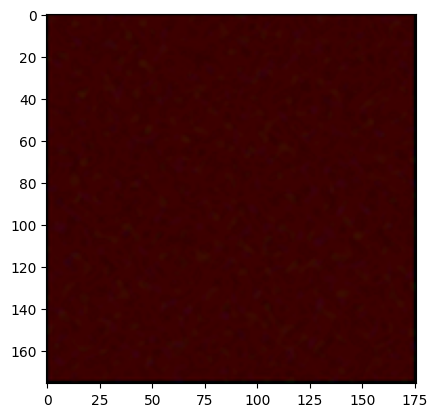

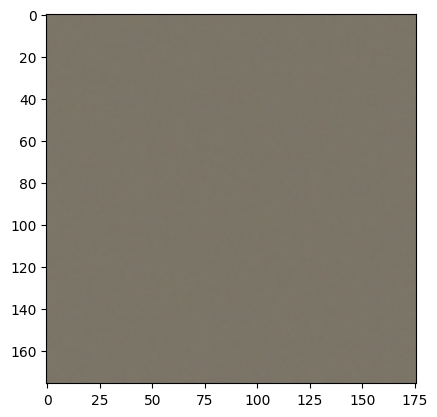

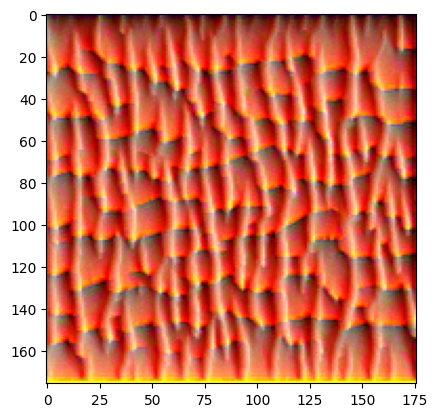

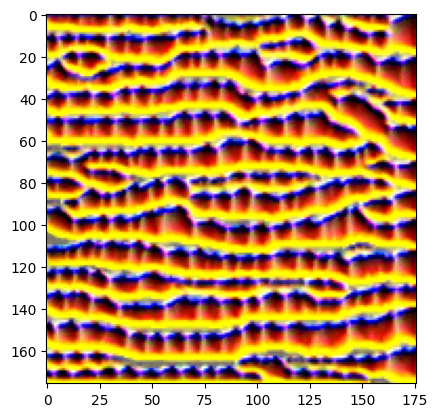

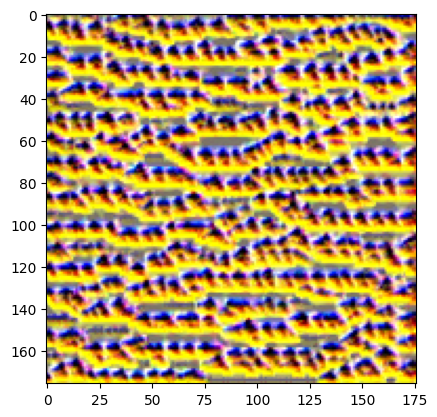

...

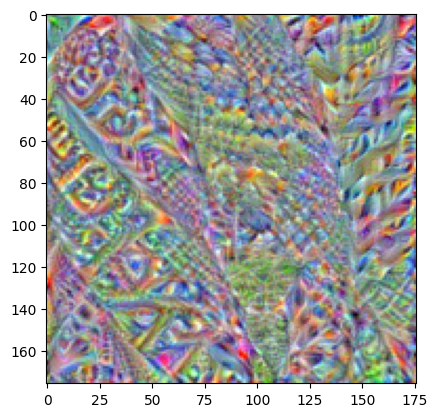

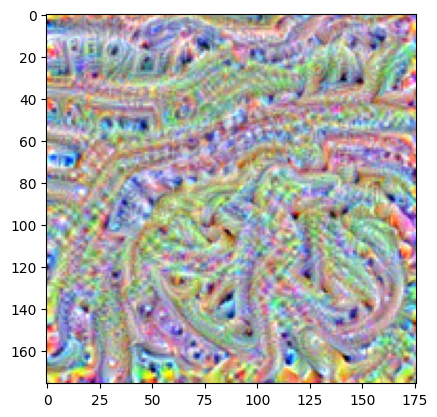

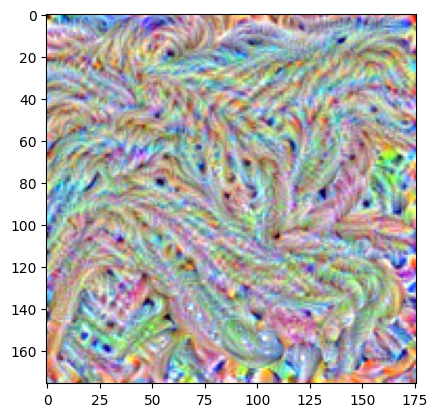

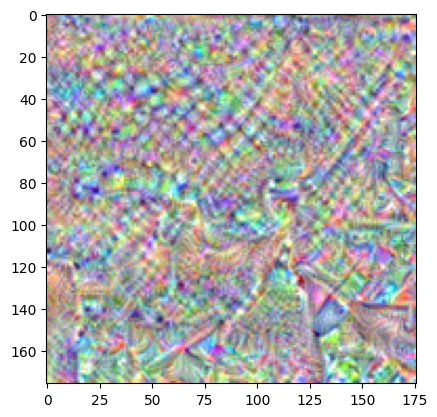

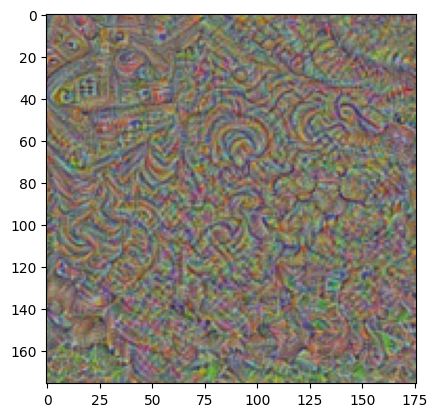

In [6]:
import matplotlib.pyplot as plt
# Which of the feature maps
filter_pos = 12
# Fully connected layer is not needed
pretrained_model = net.pretrained.features

for layer in range(30):
  cnn_layer = layer
  layer_vis = CNNLayerVisualization(pretrained_model, cnn_layer, filter_pos)
  # Layer visualization with pytorch hooks
  layer_vis.visualise_layer_with_hooks()